# **ABCDEats Inc. - Clustering Analysis**

# 1. Imports, Options and Ingestion

In [1]:
# Imports list
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.neighbors import LocalOutlierFactor
from sklearn.decomposition import PCA

from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.metrics import silhouette_score

from minisom import MiniSom

from matplotlib.patches import RegularPolygon, Ellipse
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm, colorbar
from matplotlib import colors as mpl_colors
from matplotlib.colors import LinearSegmentedColormap

from matplotlib.lines import Line2D
import seaborn as sns

from matplotlib import __version__ as mplver

from sklearn.impute import KNNImputer
from sklearn.metrics import root_mean_squared_error

In [2]:
# Style is importantuntitled:Untitled-1.ipynb?jupyter-notebook
sns.set(style="white")

# Ensuring pandas always prints all columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_seq_items', None)
pd.set_option('display.max_colwidth', 1000)

%config InlineBackend.figure_format = 'retina'

In [3]:
# Reading the csv data

data = pd.read_csv('/home/shadybea/OneDrive/General/Data Mining/Project/DM2425_ABCDEats_DATASET.csv')

# 2. Initial Transformations

In [4]:
_rename_dict = {
        'customer_region' : 'cust_region'
        , 'payment_method' : 'pay_method'
        , 'customer_age' : 'cust_age'
        , 'vendor_count' : 'n_vendor'
        , 'product_count' : 'n_product'
        , 'n_order' : 'n_order'
        , 'is_chain' : 'n_chain'
        , 'CUI_American' : 'american'
        , 'CUI_Asian' : 'asian'
        , 'CUI_Beverages' : 'beverages'
        , 'CUI_Cafe' : 'cafe'
        , 'CUI_Chicken Dishes' : 'chicken_dishes'
        , 'CUI_Chinese' : 'chinese'
        , 'CUI_Desserts' : 'desserts'
        , 'CUI_Healthy' : 'healthy'
        , 'CUI_Indian' : 'indian'
        , 'CUI_Italian' : 'italian'
        , 'CUI_Japanese' : 'japanese'
        , 'CUI_Noodle Dishes' : 'noodle_dishes'
        , 'CUI_OTHER' : 'other'
        , 'CUI_Street Food / Snacks' : 'street_food_snacks'
        , 'CUI_Thai' : 'thai'
}

# Rename the columns for easier reference
data.rename(columns=_rename_dict, inplace=True)

In [5]:
# Make the integer value of the customer hex values, the index. 
data['customer_id'] = data['customer_id'].apply(lambda x: int(x, 16))

# Set 'customer_id' as the index
data = data[~data['customer_id'].duplicated()].set_index('customer_id')

## 2.1. Missing Values

In [6]:
# Fill missing values for first_order
data.loc[data['first_order'].isna(), 'first_order'] = 0

In [7]:
# Fill missing values for HR_0
sum_week = data[[f"DOW_{n}" for n in range(7)]].sum(axis=1)
sum_day = data[[f"HR_{n}" for n in range(24)]].sum(axis=1)

data.loc[data['HR_0'].isna(), 'HR_0'] = (sum_week - sum_day)

## 2.2. Inconsistencies

### 2.2.1. Duplicate Values

In [8]:
len(data[data.duplicated(keep=False)])

94

In [9]:
len(data[data.duplicated()])

47

In [10]:
data[data.duplicated(keep=False)].head()

,cust_region,cust_age,n_vendor,n_product,n_chain,first_order,last_order,last_promo,pay_method,american,asian,beverages,cafe,chicken_dishes,chinese,desserts,healthy,indian,italian,japanese,noodle_dishes,other,street_food_snacks,thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
279920249645,2360,24.0,1,2,0,0.0,11,DELIVERY,DIGI,0.00,0.0,0.0,0.0,0.0,10.36,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0,0,1,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
288674416441,2360,24.0,1,2,0,0.0,11,DELIVERY,DIGI,0.00,0.0,0.0,0.0,0.0,10.36,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0,0,1,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0
75789856703,4660,32.0,3,4,3,1.0,43,-,CARD,10.15,0.0,0.0,0.0,0.0,0.00,0.0,0.0,6.29,0.0,14.73,0.0,0.0,0.0,0.0,4,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,2,0,0,0,0,0,0,0
948238420507,4660,32.0,3,4,3,1.0,43,-,CARD,10.15,0.0,0.0,0.0,0.0,0.00,0.0,0.0,6.29,0.0,14.73,0.0,0.0,0.0,0.0,4,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,2,0,0,0,0,0,0,0
565062243370,4660,25.0,4,5,5,3.0,69,-,CARD,11.59,0.0,0.0,0.0,0.0,0.00,0.0,0.0,3.21,0.0,8.85,0.0,0.0,0.0,0.0,0,0,1,1,1,1,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,2,0,0,1,0,0,0


We find 94 such rows, regarding 47 entries; and simply drop the repeats.

In [11]:
data = data.drop_duplicates()

### 2.2.2. Inconsistent Values

In [12]:
# has at least one vendor
has_vendor = data['n_vendor'] != 0 

# has at least one product
has_product = data['n_product'] != 0 

# purchase must have been made on a valid dow
some_day = (data[[f"DOW_{n}" for n in range(7)]] != 0).any(axis = 1) 

# purchase must have been made at a valid hour
some_hour = (data[[f"HR_{n}" for n in range(24)]] != 0).any(axis = 1)  

# some type of cuisine must have been ordered
some_food = (data[data.columns[9:24]] != 0).any(axis = 1) 

# We find 156 such values
data[~(has_vendor & has_product & some_day & some_hour & some_food)].shape[0] 

156

In [13]:
data[~(has_vendor & has_product & some_day & some_hour & some_food)].head()

,cust_region,cust_age,n_vendor,n_product,n_chain,first_order,last_order,last_promo,pay_method,american,asian,beverages,cafe,chicken_dishes,chinese,desserts,healthy,indian,italian,japanese,noodle_dishes,other,street_food_snacks,thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
313583212919,8670,22.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
864549373045,8670,26.0,0,0,0,1.0,1,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1058834316737,8670,21.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
853877159675,8670,38.0,0,0,0,2.0,2,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
118047929230,8670,24.0,0,0,0,3.0,3,-,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [14]:
data = data[(has_vendor & has_product & some_day & some_hour & some_food)]  # And we drop these values

In [15]:
# Check if the sum of the order counts for DOW, match the sum of the order counts for HR.
sum_week = data[[f"DOW_{n}" for n in range(7)]].sum(axis=1)
sum_day = data[[f"HR_{n}" for n in range(24)]].sum(axis=1)

data[(sum_day != sum_week)].shape[0]  # Bam

0

In [16]:
# Check if there are any customers, for whom 'last_order' was placed before 'first_order'.
data[data['last_order'] < data['first_order']].shape[0]  # Double Bam

0

### 2.2.3. Weird Values

In [17]:
# Customer Region
data.loc[data['cust_region'] == '-', 'cust_region'] = '8670'
data.loc[data['cust_region'].isin(['2440', '2490']), 'cust_region'] = '2400'

# Add the feature Customer CIty
data['cust_city'] = data['cust_region'].apply(lambda x: x[0])

In [18]:
# Last Promo
data.loc[data['last_promo'] == '-', 'last_promo'] = 'NO_PROMO'

## 2.3. Data Types

In [19]:
# Tidying up datatypes
for col in data.iloc[:, 0:9]:
    if col in ['last_promo', 'pay_method']:
        data[col] = data[col].astype(object)
    else:
        data[col] = data[col].astype('Int64')

for col in data.iloc[:, 9:24]:
    data[col] = data[col].astype(float)

for col in data.iloc[:, 24:]:
    data[col] = data[col].astype('Int64')

In [20]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31672 entries, 118371798366 to 1087714341088
Data columns (total 56 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   cust_region         31672 non-null  Int64  
 1   cust_age            30945 non-null  Int64  
 2   n_vendor            31672 non-null  Int64  
 3   n_product           31672 non-null  Int64  
 4   n_chain             31672 non-null  Int64  
 5   first_order         31672 non-null  Int64  
 6   last_order          31672 non-null  Int64  
 7   last_promo          31672 non-null  object 
 8   pay_method          31672 non-null  object 
 9   american            31672 non-null  float64
 10  asian               31672 non-null  float64
 11  beverages           31672 non-null  float64
 12  cafe                31672 non-null  float64
 13  chicken_dishes      31672 non-null  float64
 14  chinese             31672 non-null  float64
 15  desserts            31672 non-null  flo

In [21]:
data.head()

,cust_region,cust_age,n_vendor,n_product,n_chain,first_order,last_order,last_promo,pay_method,american,asian,beverages,cafe,chicken_dishes,chinese,desserts,healthy,indian,italian,japanese,noodle_dishes,other,street_food_snacks,thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,cust_city
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
118371798366,2360,18,2,5,1,0,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,2
400089128395,8670,17,2,2,2,0,1,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,8
1060080106083,4660,38,1,2,2,0,1,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,4
103287041752,4660,<NA>,2,3,1,0,2,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,4
338018592517,4660,20,2,5,0,0,2,NO_PROMO,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4


# 3. Feature Engineering

We create lists of features for easy reference.

In [22]:
# Categorical variables
non_metric_features = ['cust_region', 'last_promo', 'pay_method', 'cust_city']

# Hour of day variables
hour_features = data.columns[31:55].to_list()

# Day of week variables
day_features = data.columns[24:31].to_list()

# Cuisine features
cuisine_features = data.columns[9:24].to_list()

# Metric variables, that are not above
metric_features = data.columns.drop(non_metric_features).drop(hour_features).drop(day_features).drop(cuisine_features).to_list()

In [23]:
# Total amount spent by customer on all types of cuisine
data['total_amt'] = data[cuisine_features].sum(axis=1)

# Number of orders made by the customer
data['n_order'] = data[day_features].sum(axis=1)

# Amount spent on average per product
data['avg_amt_per_product'] = data['total_amt'] / data['n_product']

# Amount spent on average per order
data['avg_amt_per_order'] = data['total_amt'] / data['n_order']

# Amount spent on average per vendor
data['avg_amt_per_vendor'] = data['total_amt'] / data['n_vendor']

# Total days as customer
data['days_cust'] = data['last_order'] - data['first_order']

# Average days between orders
data['avg_days_to_order'] = data['days_cust'] / data['n_order']

# Days the customer is due, according to their average days between orders
data['days_due'] = 90 - data['last_order'] + data['avg_days_to_order']

# Percentage of orders placed to restaurants that are part of a chain
data['per_chain_order'] = data['n_chain'] / data['n_order']

# And we add these tese features to the metric features list.
metric_features.extend(
    [
        'n_order'
        , 'per_chain_order'
        ,'total_amt'
        , 'avg_amt_per_order'
        , 'avg_amt_per_product'
        , 'avg_amt_per_vendor'
        , 'days_cust'
        , 'avg_days_to_order'
        , 'days_due'
    ]
)

In [24]:
# Create a mask to check if each day column is populated
mask = data[[f'DOW_{i}' for i in range(7)]] > 0

# Sum over the mask to get the count of days with purchases for each row
data.loc[:, 'n_days_week'] = mask.sum(axis=1)

# Updating the list of metric features
metric_features.append('n_days_week')

In [25]:
# Create a mask to check if each hour column is populated
mask = data[hour_features] > 0

# Sum over the mask to get the count of hours with purchases for each row
data.loc[:, 'n_times_day'] = mask.sum(axis=1)

# Updating the list of metric features
metric_features.append('n_times_day')

In [26]:
# Flag customers who have purchased in more than one day
data['regular'] = (data['days_cust'] > 2)

non_metric_features.append('regular')

In [27]:
# Create a mask where values are greater than zero (indicating an order)
mask = data[cuisine_features] > 0

# # Use mask to get the ordered cuisines for each row
# data.loc[:, 'ordered_cuisines'] = mask.apply(lambda row: [cuisine for cuisine, ordered in row.items() if ordered], axis=1)

# # Updating the non_metric_features_list
# non_metric_features.append('ordered_cuisines')

# Use mask to get the number of cuisines for each row
data.loc[:, 'n_cuisines'] = mask.sum(axis=1)

# Updating the metric_features_list
metric_features.append('n_cuisines')

In [28]:
# Dropping specified columns and getting remaining columns as a list
targets = data.drop(columns=[
    'cust_age'
    , 'first_order'
    , 'last_order'
    , 'days_cust'
    , 'days_due'
    , 'avg_days_to_order'
    , 'per_chain_order'
    , 'cust_region'
    , 'cust_city'
    , 'last_promo'
    , 'pay_method'
    # , 'ordered_cuisines'
    , 'n_cuisines'
    , 'regular'
] + hour_features + day_features).columns.tolist()

# Initialize an empty DataFrame to store log-transformed columns
log_transformed = pd.DataFrame()

# Apply log1p to each column in targets and add it to log_transformed with the prefix 'log_'
for col in targets:
    log_transformed[f"log_{col}"] = np.log1p(data[col])

# We create a list of log_features to assist us in our exploration
log_features = log_transformed.columns.tolist()

# Concatenate the original DataFrame with the new log-transformed DataFrame
data = pd.concat([data, log_transformed], axis=1)

In [29]:
# Initialize dictionaries for feature groups with flags and relevant columns
feature_groups = {
    'foodie': ['n_vendor', 'n_product', 'n_order', 'n_cuisines'],
    'gluttonous': ['avg_amt_per_order', 'total_amt', 'n_chain'],
    'loyal': ['avg_amt_per_vendor'] + cuisine_features
}


# Create columns to hold the flags for each feature group
data['foodie_flag'] = 0
data['gluttonous_flag'] = 0
data['loyal_flag'] = 0

# Function to calculate IQR bounds
def calculate_bounds(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return lower_bound, upper_bound

# Assign flags for each feature group
for group, features in feature_groups.items():
    for feature in features:
        log_feature = f"log_{feature}"
        
        if feature == 'n_cuisines':
            log_feature = feature
        
        lower_bound, upper_bound = calculate_bounds(data.loc[(data['regular'] == 1) & (data[feature] > 0), log_feature])
        
        # Mark outliers for each group
        if group == 'foodie':
            data.loc[data['regular'] == 1, 'foodie_flag'] |= (
                data.loc[data['regular'] == 1, log_feature] > upper_bound
            ).astype(int)
        elif group == 'gluttonous':
            data.loc[data['regular'] == 1, 'gluttonous_flag'] |= (
                data.loc[data['regular'] == 1, log_feature] > upper_bound
            ).astype(int)
        elif group == 'loyal':
            data.loc[data['regular'] == 1, 'loyal_flag'] |= (
                data.loc[data['regular'] == 1, log_feature] > upper_bound
            ).astype(int)

# Display results
for group in ['foodie_flag', 'gluttonous_flag', 'loyal_flag']:
    print(f"Number of customers flagged as {group.split('_')[0]}:", data[group].sum())

non_metric_features.extend([
    'foodie_flag'
    ,'gluttonous_flag'
    ,'loyal_flag'
])

Number of customers flagged as foodie: 2852
Number of customers flagged as gluttonous: 639
Number of customers flagged as loyal: 445


In [30]:
def top_n(row, col_list, n):
    # Sort the specified columns in descending order
    sorted_row = row[col_list].sort_values(ascending=False)

    # Get the unique sorted values
    unique_sorted_values = sorted_row.unique()

    # Ensure there are enough unique values to determine the n-th largest
    if len(unique_sorted_values) >= n:
        nth_value = unique_sorted_values[n - 1]  # Get the n-th largest unique value

        # If the n-th value is 0, return None
        if nth_value == 0:
            return None
        
        # If n > 1, check for uniqueness against the (n-1)-th largest
        if n > 1:
            prev_value = unique_sorted_values[n - 2]  # (n-1)-th largest unique value
            # If nth_value is equal to the (n-1)-th value, we don't want to return it
            if nth_value == prev_value:
                return None
        
        # Return the index of the n-th largest value
        return sorted_row[sorted_row == nth_value].index[0]

    # Return None if conditions are not met
    return None

In [31]:
data['top_cuisine'] = data.apply(top_n, col_list=cuisine_features, n=1, axis=1)

non_metric_features.append('top_cuisine')

In [32]:
# Average amount spent per day as customer
data['avg_amt_per_day'] = np.round(data['total_amt'] / data['days_cust'], 4)

# Average number of products ordered per day as customer
data['avg_product_per_day'] = np.round(data['n_product'] / data['days_cust'], 4)

# Average number of orders per day as customer
data['avg_order_per_day'] = np.round(data['n_order'] / data['days_cust'], 4)

metric_features.extend([
    'avg_amt_per_day'
    ,'avg_product_per_day'
    ,'avg_order_per_day'
])

# 4. Preprocessing

Before starting the preprocessing efforts, there are some customers that can be perceived as outliers, namely the ones that were flagged as part of a group or non-regulars. Therefore, we create an auxiliary dataframe excluding these, which we will use in a fashion resembling a train-test split, where these are the training data.

In [33]:
# Create dataframe with only customers which are regular and do not belong to another group
aux_df = data[data['regular'] == 1]

## 4.1. Outliers

Based on the boxplots of the EDA part of the project, we can filter our dataset using the following conditions.

In [34]:
og_rows = data.shape[0]

In [35]:
def compute_percentile_bounds(reference_data, filters):
    """
    Compute percentile bounds for the given filters using the reference dataset.

    :param reference_data: DataFrame used to compute the percentiles.
    :param filters: Dictionary of column names and (lower_percentile, upper_percentile).
    :return: Dictionary with column names and the corresponding (lower_bound, upper_bound).
    """
    bounds = {}
    
    for col, percentiles in filters.items():
        if col not in reference_data.columns:
            raise ValueError(f"Column '{col}' not found in the reference DataFrame.")

        lower_percentile, upper_percentile = percentiles
        lower_bound = reference_data[col].quantile(lower_percentile) if lower_percentile is not None else None
        upper_bound = reference_data[col].quantile(upper_percentile) if upper_percentile is not None else None
        bounds[col] = (lower_bound, upper_bound)

    return bounds

def filter_by_bounds(data, bounds):
    """
    Filter the data using precomputed bounds.

    :param data: DataFrame to be filtered.
    :param bounds: Dictionary with column names and the corresponding (lower_bound, upper_bound).
    :return: Filtered DataFrame.
    """
    conditions = []

    for col, (lower_bound, upper_bound) in bounds.items():
        if col not in data.columns:
            raise ValueError(f"Column '{col}' not found in the DataFrame.")

        if lower_bound is not None:
            conditions.append(data[col] >= lower_bound)
        if upper_bound is not None:
            conditions.append(data[col] <= upper_bound)

    if conditions:
        combined_condition = conditions[0]
        for condition in conditions[1:]:
            combined_condition &= condition
        return data[combined_condition]

    return data

# Example Usage:
# Compute bounds using dataset a
defined_filters = {
    **{col: (None, 0.999) for col in aux_df.columns if 'log' in col}
}
percentile_bounds = compute_percentile_bounds(aux_df, defined_filters)

# Filter dataset b using the computed bounds
data = filter_by_bounds(data, percentile_bounds)


In [36]:
print('Percentage of data kept after removing outliers:', 100 * np.round(data.shape[0] / og_rows, 4))

Percentage of data kept after removing outliers: 94.95


Let us recheck the boxplots

In [37]:
target = data.drop(columns=non_metric_features).columns
num_features = len(target)
num_columns = 4
num_rows = (num_features + num_columns - 1) // num_columns

fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(15, 5 * num_rows))

axes = axes.flatten()

# Loop through each numeric feature to plot histograms
for ax, feature in zip(axes, target):
    sns.boxplot(y=data[feature], color='#666666', ax=ax)  
    ax.set_title(f'{feature}')

# Hide any empty subplots
for i in range(len(target), len(axes)):
    fig.delaxes(axes[i])

plt.suptitle('Boxplots of All Features (exluding Non-Metric Features)')
plt.tight_layout(rect=[0, 0, 1, 0.98])

# Show the plot
plt.show()

## 4.2. Missing Values

In [38]:
# Recreate dataframe with only customers which are regular and do not belong to another group
aux_df = data[data['regular'] == 1]

In [39]:
data.isna().sum()

cust_region                  0
cust_age                   691
n_vendor                     0
n_product                    0
n_chain                      0
first_order                  0
last_order                   0
last_promo                   0
pay_method                   0
american                     0
asian                        0
beverages                    0
cafe                         0
chicken_dishes               0
chinese                      0
desserts                     0
healthy                      0
indian                       0
italian                      0
japanese                     0
noodle_dishes                0
other                        0
street_food_snacks           0
thai                         0
DOW_0                        0
DOW_1                        0
DOW_2                        0
DOW_3                        0
DOW_4                        0
DOW_5                        0
DOW_6                        0
HR_0                         0
HR_1    

There are missing values for 'cust_age', which will be imputed using a strategy to be determined next.

In [40]:
np.random.seed(20)

test_df = pd.DataFrame(aux_df['cust_age'].copy(deep=True).dropna())

data_with_missing = test_df.copy()
data_with_missing.loc[np.random.choice(data_with_missing.index, size=2000, replace=False)] = np.nan

mean_imputed = data_with_missing.fillna(data_with_missing.mean().astype('int'), inplace=False)
median_imputed = data_with_missing.fillna(data_with_missing.median(), inplace=False)

# Distance-based imputation (k-NN)
knn_imputer = KNNImputer(n_neighbors=5, weights='uniform')
knn_imputed = pd.DataFrame(knn_imputer.fit_transform(data_with_missing), columns=data_with_missing.columns)


rmse_mean = root_mean_squared_error(test_df['cust_age'], mean_imputed['cust_age'])
rmse_median = root_mean_squared_error(test_df['cust_age'], median_imputed['cust_age'])
rmse_knn = root_mean_squared_error(test_df['cust_age'], knn_imputed['cust_age'])

print(f"Mean Imputation RMSE: {rmse_mean:.4f}")
print(f"Median Imputation RMSE: {rmse_median:.4f}")
print(f"KNN Imputation RMSE: {rmse_knn:.4f}")

Mean Imputation RMSE: 2.0767
Median Imputation RMSE: 2.1140
KNN Imputation RMSE: 2.0739


According to the results above, the difference between filling the missing values with the mean over the median yields better results and is not much different than imputing them using the KNN algorithm. Since the computational complexity is lower, we opt to fill the missing values of the original dataframe using the mean.

In [41]:
data.loc[data['cust_age'].isna(), 'cust_age'] = aux_df['cust_age'].mean().astype('int')

## 4.3. Categorical Encoding

In [42]:
# Recreate the auxiliary dataframe
aux_df = data[data['regular'] == 1]

In [43]:
ohe = OneHotEncoder(sparse_output=False).set_output(transform='pandas')
# ohe.fit(aux_df[non_metric_features[:4]])
ohe_df = ohe.fit_transform(data[non_metric_features[:4]])

ohe_feat_names = ohe.get_feature_names_out()

In [44]:
ohe_df.head()

,cust_region_2360.0,cust_region_2400.0,cust_region_4140.0,cust_region_4660.0,cust_region_8370.0,cust_region_8550.0,cust_region_8670.0,last_promo_DELIVERY,last_promo_DISCOUNT,last_promo_FREEBIE,last_promo_NO_PROMO,pay_method_CARD,pay_method_CASH,pay_method_DIGI,cust_city_2.0,cust_city_4.0,cust_city_8.0
customer_id,,,,,,,,,,,,,,,,,
118371798366,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
400089128395,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1060080106083,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
103287041752,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
338018592517,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0


In [45]:
data = pd.concat([data.drop(columns=non_metric_features[:4]), ohe_df], axis=1)

data.head()

,cust_age,n_vendor,n_product,n_chain,first_order,last_order,american,asian,beverages,cafe,chicken_dishes,chinese,desserts,healthy,indian,italian,japanese,noodle_dishes,other,street_food_snacks,thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,total_amt,n_order,avg_amt_per_product,avg_amt_per_order,avg_amt_per_vendor,days_cust,avg_days_to_order,days_due,per_chain_order,n_days_week,n_times_day,regular,n_cuisines,log_n_vendor,log_n_product,log_n_chain,log_american,log_asian,log_beverages,log_cafe,log_chicken_dishes,log_chinese,log_desserts,log_healthy,log_indian,log_italian,log_japanese,log_noodle_dishes,log_other,log_street_food_snacks,log_thai,log_total_amt,log_n_order,log_avg_amt_per_product,log_avg_amt_per_order,log_avg_amt_per_vendor,log_n_days_week,log_n_times_day,foodie_flag,gluttonous_flag,loyal_flag,top_cuisine,avg_amt_per_day,avg_product_per_day,avg_order_per_day,cust_region_2360.0,cust_region_2400.0,cust_region_4140.0,cust_region_4660.0,cust_region_8370.0,cust_region_8550.0,cust_region_8670.0,last_promo_DELIVERY,last_promo_DISCOUNT,last_promo_FREEBIE,last_promo_NO_PROMO,pay_method_CARD,pay_method_CASH,pay_method_DIGI,cust_city_2.0,cust_city_4.0,cust_city_8.0
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
118371798366,18,2,5,1,0,1,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,28.88,2,5.776,14.44,14.44,1,0.5,89.5,0.5,2,1,False,1,1.098612,1.791759,0.693147,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,3.397189,0.0,0.0,0.0,0.0,0.0,0.0,3.397189,1.098612,1.913387,2.736962,2.736962,1.098612,0.693147,0,0,0,indian,28.88,5.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
400089128395,17,2,2,2,0,1,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,19.21,2,9.605,9.605,9.605,1,0.5,89.5,1.0,2,2,False,2,1.098612,1.098612,1.098612,2.626117,2.000128,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,3.006178,1.098612,2.361326,2.361326,2.361326,1.098612,1.098612,0,0,0,american,19.21,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1060080106083,38,1,2,2,0,1,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,9.20,2,4.6,4.6,9.2,1,0.5,89.5,1.0,2,2,False,1,0.693147,1.098612,1.098612,2.322388,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,2.322388,1.098612,1.722767,1.722767,2.322388,1.098612,1.098612,0,0,0,american,9.2,2.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
103287041752,27,2,3,1,0,2,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,31.56,2,10.52,15.78,15.78,2,1.0,89.0,0.5,2,2,False,2,1.098612,1.386294,0.693147,0.000000,2.687847,0.0,0.0,0.0,0.0,0.0,0.0,2.937043,0.0,0.0,0.0,0.0,0.0,0.0,3.483085,1.098612,2.444085,2.820188,2.820188,1.098612,1.098612,0,0,0,indian,15.78,1.5,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
338018592517,20,2,5,0,0,2,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,55.44,2,11.088,27.72,27.72,2,1.0,89.0,0.0,2,2,False,2,1.098612,1.791759,0.0,2.745346,3.734570,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,4.033178,1.098612,2.492213,3.357594,3.357594,1.098612,1.098612,0,0,0,asian,27.72,2.5,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0


Before moving on with the remaining preprocessing, we will make a split in our data. As mentioned in our EDA report, we believe the one-time customers are a special group of customers and that keeping them through out the entirety of our analysis could compromise it negatively. Therefore, we will create a new dataset that does not contain this set of customers and will return to them later.

In [46]:
regulars = data[data['regular'] == 1].copy(deep=True)

## 4.4. Data Normalization

For this step, we create two datasets, one using StandardScaler and another using MinMaxScaler. The clustering efforts will be applied to both and we will then choose the one which yields the best results.

In [47]:
scaler = StandardScaler().set_output(transform='pandas')
regulars = pd.concat([scaler.fit_transform(regulars.drop(columns=list(ohe_feat_names) + non_metric_features[4:])), regulars[list(ohe_feat_names) + non_metric_features[4:]]], axis=1)

## 4.5. Multidimensional Outliers

Now, Local Outlier Factor can be applied to remove the multidimensional outliers, since the data is scaled.

In [48]:
regulars_og = regulars.shape[0]

In [49]:
lof_std = LocalOutlierFactor(n_neighbors=5)

outlier_predictions = lof_std.fit_predict(regulars.drop(columns=list(ohe_feat_names) + non_metric_features[4:]))

# Mark outliers
regulars['Outlier'] = np.where(outlier_predictions == -1, True, False)

# Remove outliers
regulars = regulars[regulars['Outlier'] == False].drop(columns=['Outlier'])

In [50]:
print('Percentage of data kept after removing outliers:', 100 * np.round(regulars.shape[0] / regulars_og, 4))

Percentage of data kept after removing outliers: 98.68


## 4.6. Feature Selection

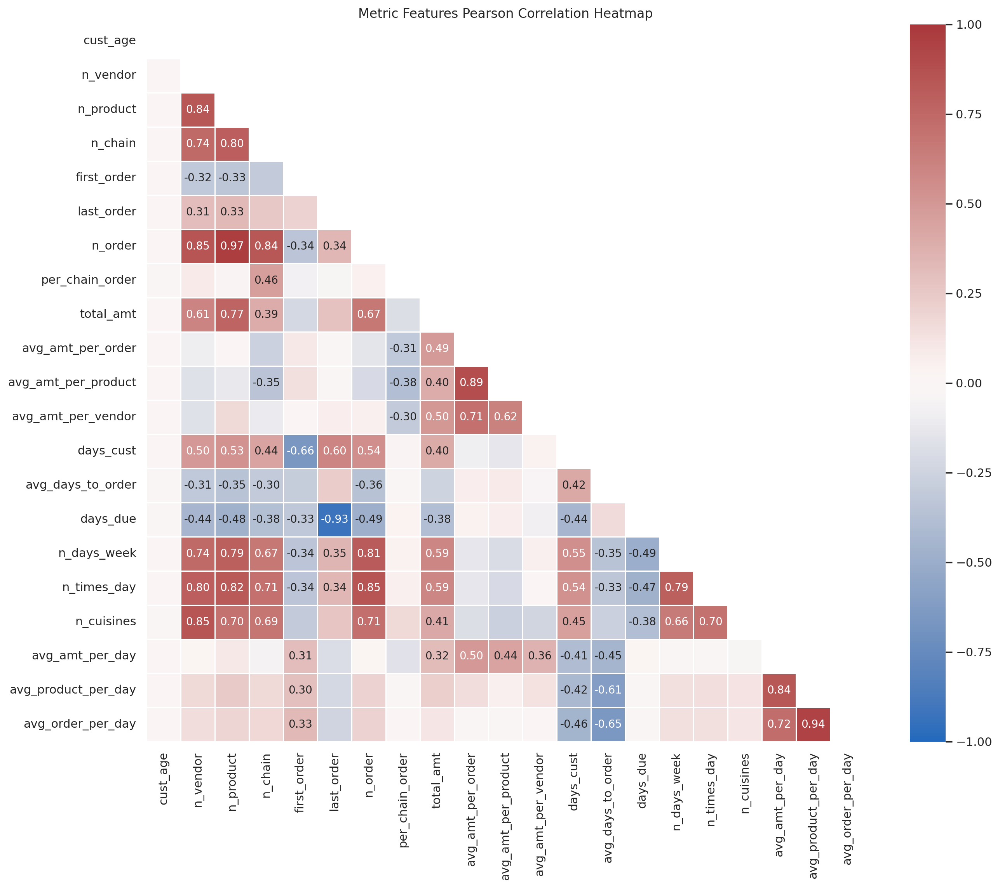

In [51]:
# compute the correlation matrix for the metric features
corr_matrix = regulars[metric_features].corr(method='pearson')

plt.figure(figsize=(15,12))

# create a mask for the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

annot = np.full(corr_matrix.shape, '', dtype=object)

# Fill the annotation array with formatted values for correlations above the threshold
for i in range(corr_matrix.shape[0]):
    for j in range(corr_matrix.shape[1]):
        if abs(corr_matrix.iat[i, j]) >= 0.3:
            annot[i, j] = f"{corr_matrix.iat[i, j]:.2f}" 

# create the heatmap
sns.heatmap(data=corr_matrix, annot=annot, cmap='vlag', 
            fmt="", center=0, vmin=-1, vmax=1, square=True, 
            linewidths=.5, mask=mask, annot_kws={"size": 10})

# Show the plot
plt.title('Metric Features Pearson Correlation Heatmap')
plt.show()

We will perform PCA with the variables avg_amt_per_day, avg_product_per_day, avg_order_per_day, n_product and n_order - in order to reduce dimensionality and assess if the resulting principal components are of any help.

In [52]:
pca = PCA(random_state=20)
pca_feat = pca.fit_transform(regulars[['avg_amt_per_day', 'avg_product_per_day', 'avg_order_per_day', 'n_product', 'n_order']])

In [53]:
# Get the eigenvalues (explained variance)
explained_variance = pca.explained_variance_

# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# get the cumulative explained variance ratio 
cumulative_explained_variance_ratio = np.cumsum(explained_variance_ratio)

# Combine into a dataframe
pca_results = pd.DataFrame(
    {
        "Eigenvalue": explained_variance,
        "Difference": np.insert(np.diff(explained_variance), 0, 0),
        "Proportion": explained_variance_ratio,
        "Cumulative": cumulative_explained_variance_ratio
    },
        index=range(1, pca.n_components_ + 1)
)

pca_results

,Eigenvalue,Difference,Proportion,Cumulative
1,2.645359,0.000000,0.568847,0.568847
2,1.673599,-0.971759,0.359884,0.928731
3,0.272157,-1.401443,0.058523,0.987255
4,0.044690,-0.227467,0.009610,0.996865
5,0.014581,-0.030109,0.003135,1.000000


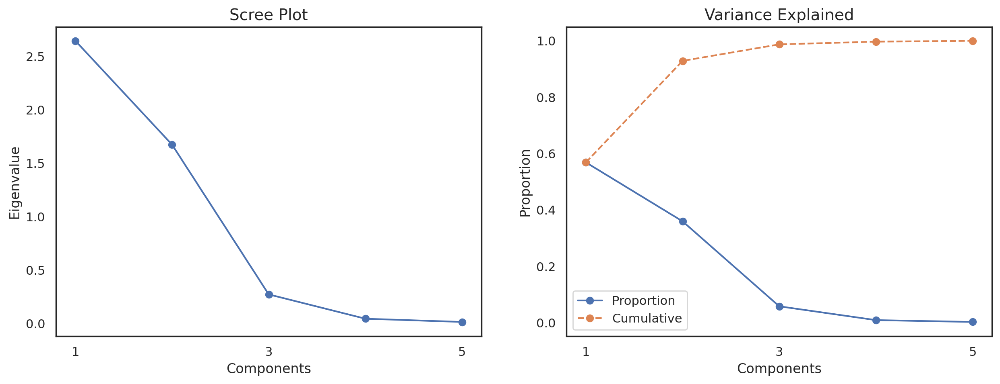

In [54]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots

ax1.plot(explained_variance, # PLOT THE EIGENVALUES (EXPLAINED VARIANCE)
         marker=".", markersize=12)

ax2.plot(explained_variance_ratio,  # PLOT THE EXPLAINED VARIANCE RATIO
         marker=".", markersize=12, label="Proportion")

ax2.plot(cumulative_explained_variance_ratio,  # PLOT THE CUMULATIVE EXPLAINED VARIANCE RATIO
         marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [55]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=3, random_state=20)
pca_feat = pca.fit_transform(regulars[['avg_amt_per_day', 'avg_product_per_day', 'avg_order_per_day', 'n_product', 'n_order']])
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]

# remember index=df_pca.index
pca_df = pd.DataFrame(pca_feat, index=regulars.index, columns=pca_feat_names)  
pca_df.head()

,PC0,PC1,PC2
customer_id,,,
392537344460,8.099764,-3.888726,-3.497241
568938099255,7.434463,-4.442288,1.255290
950459557146,7.037693,-3.764431,-1.344881
339296060607,6.046553,-3.965094,2.423813
580679708215,4.691865,-3.114211,0.346974


In [56]:
# Reassigning df to contain pca variables
df_pca = pd.concat([regulars, pca_df], axis=1)
df_pca.head()

,cust_age,n_vendor,n_product,n_chain,first_order,last_order,american,asian,beverages,cafe,chicken_dishes,chinese,desserts,healthy,indian,italian,japanese,noodle_dishes,other,street_food_snacks,thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,total_amt,n_order,avg_amt_per_product,avg_amt_per_order,avg_amt_per_vendor,days_cust,avg_days_to_order,days_due,per_chain_order,n_days_week,n_times_day,n_cuisines,log_n_vendor,log_n_product,log_n_chain,log_american,log_asian,log_beverages,log_cafe,log_chicken_dishes,log_chinese,log_desserts,log_healthy,log_indian,log_italian,log_japanese,log_noodle_dishes,log_other,log_street_food_snacks,log_thai,log_total_amt,log_n_order,log_avg_amt_per_product,log_avg_amt_per_order,log_avg_amt_per_vendor,log_n_days_week,log_n_times_day,avg_amt_per_day,avg_product_per_day,avg_order_per_day,cust_region_2360.0,cust_region_2400.0,cust_region_4140.0,cust_region_4660.0,cust_region_8370.0,cust_region_8550.0,cust_region_8670.0,last_promo_DELIVERY,last_promo_DISCOUNT,last_promo_FREEBIE,last_promo_NO_PROMO,pay_method_CARD,pay_method_CASH,pay_method_DIGI,cust_city_2.0,cust_city_4.0,cust_city_8.0,regular,foodie_flag,gluttonous_flag,loyal_flag,top_cuisine,PC0,PC1,PC2
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
392537344460,-1.062794,-0.255645,-0.438751,-0.367579,-1.131978,-3.529733,-0.251215,-0.490220,-0.318521,-0.164973,-0.274746,-0.261906,-0.206279,0.676124,-0.256466,-0.34395,-0.365356,-0.203844,0.429064,-0.280262,-0.231026,-0.654153,-0.650697,0.292475,-0.695157,-0.739816,-0.709954,1.003126,-0.175163,-0.185042,-0.201250,-0.257621,-0.255983,-0.249167,-0.232336,-0.243496,-0.268986,-0.368712,-0.430681,-0.467335,-0.436,-0.424103,-0.409606,-0.43416,-0.468338,0.546941,-0.434366,0.879759,-0.295737,-0.230157,-0.183809,3.329023,-0.700479,-0.485355,-0.990954,-0.716014,-0.785654,-1.774310,-1.431390,3.017032,0.085429,-0.809055,-0.228684,0.239791,-0.088166,-0.367872,-0.165975,0.294220,-0.787099,-0.462537,-0.219974,-0.350989,-0.363521,-0.26383,2.263880,-0.353053,-0.50788,-0.514445,-0.278999,1.390210,-0.391222,-0.296413,-0.893407,-0.500059,-0.985680,-0.720268,-1.032900,-0.810984,-0.061505,2.251884,6.610084,6.669267,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,True,0,0,0,other,8.099764,-3.888726,-3.497241
568938099255,-1.062794,-0.634527,-0.609314,-0.914561,-1.131978,-3.529733,-0.487428,0.908716,-0.318521,-0.164973,-0.274746,-0.261906,-0.206279,-0.204695,-0.256466,-0.34395,-0.365356,-0.203844,-0.373920,-0.280262,-0.231026,-0.654153,-0.650697,0.292475,-0.695157,-0.739816,-0.709954,0.147443,-0.175163,-0.185042,-0.201250,1.586116,1.911946,-0.249167,-0.232336,-0.243496,-0.268986,-0.368712,-0.430681,-0.467335,-0.436,-0.424103,-0.409606,-0.43416,-0.468338,-0.471480,-0.434366,-0.365838,-0.295737,-0.230157,-0.183809,-0.187572,-0.254283,-0.712064,1.207233,1.211029,0.335901,-1.774310,-1.362002,3.044007,-1.812773,-0.809055,-0.727559,-1.130026,-0.719437,-0.747226,-1.732819,-0.744008,1.467620,-0.462537,-0.219974,-0.350989,-0.363521,-0.26383,-0.277754,-0.353053,-0.50788,-0.514445,-0.278999,-0.549732,-0.391222,-0.296413,0.071889,-1.044735,1.126104,1.256865,0.676018,-0.810984,-0.785033,6.056815,4.701867,4.082421,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,True,0,0,0,asian,7.434463,-4.442288,1.255290
950459557146,-1.062794,-0.634527,-0.438751,-0.367579,-1.131978,-3.529733,0.094087,-0.490220,-0.318521,-0.164973,-0.274746,1.633604,-0.206279,-0.204695,-0.256466,-0.34395,-0.365356,-0.203844,-0.373920,-0.280262,-0.231026,-0.654153,-0.650697,0.292475,-0.695157,-0.739816,-0.709954,0.147443,-0.175163,-0.185042,-0.201250,-0.257621,-0.255983,-0.249167,-0.232336,-0.243496,-0.268986,-0.368712,-0.430681,0.586679,-0.436,-0.424103,-0.409606,-0.43416,-0.468338,-0.471480,-0.434366,0.879759,-0.295737,-0.23

In [57]:
loadings = df_pca[['avg_amt_per_day', 'avg_product_per_day', 'avg_order_per_day', 'n_product', 'n_order'] + pca_feat_names].corr().loc[['avg_amt_per_day', 'avg_product_per_day', 'avg_order_per_day', 'n_product', 'n_order'], pca_feat_names]

In [58]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: #ffbdbd'
    elif val > 0.45:
        color = 'background-color: #b3ffcc'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings.style.map(_color_red_or_green)

,PC0,PC1,PC2
avg_amt_per_day,0.817342,-0.408336,0.401915
avg_product_per_day,0.946855,-0.267161,-0.093337
avg_order_per_day,0.901547,-0.265400,-0.327153
n_product,0.501855,0.852353,0.093179
n_order,0.466566,0.875900,-0.021255


In [59]:
df_pca.drop(columns='PC2', inplace=True)

In [60]:
df_pca.rename(columns={'PC0': 'transaction_volume', 'PC1': 'interaction_rate'}, inplace=True)

In [61]:
df_pca.head()

,cust_age,n_vendor,n_product,n_chain,first_order,last_order,american,asian,beverages,cafe,chicken_dishes,chinese,desserts,healthy,indian,italian,japanese,noodle_dishes,other,street_food_snacks,thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,total_amt,n_order,avg_amt_per_product,avg_amt_per_order,avg_amt_per_vendor,days_cust,avg_days_to_order,days_due,per_chain_order,n_days_week,n_times_day,n_cuisines,log_n_vendor,log_n_product,log_n_chain,log_american,log_asian,log_beverages,log_cafe,log_chicken_dishes,log_chinese,log_desserts,log_healthy,log_indian,log_italian,log_japanese,log_noodle_dishes,log_other,log_street_food_snacks,log_thai,log_total_amt,log_n_order,log_avg_amt_per_product,log_avg_amt_per_order,log_avg_amt_per_vendor,log_n_days_week,log_n_times_day,avg_amt_per_day,avg_product_per_day,avg_order_per_day,cust_region_2360.0,cust_region_2400.0,cust_region_4140.0,cust_region_4660.0,cust_region_8370.0,cust_region_8550.0,cust_region_8670.0,last_promo_DELIVERY,last_promo_DISCOUNT,last_promo_FREEBIE,last_promo_NO_PROMO,pay_method_CARD,pay_method_CASH,pay_method_DIGI,cust_city_2.0,cust_city_4.0,cust_city_8.0,regular,foodie_flag,gluttonous_flag,loyal_flag,top_cuisine,transaction_volume,interaction_rate
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
392537344460,-1.062794,-0.255645,-0.438751,-0.367579,-1.131978,-3.529733,-0.251215,-0.490220,-0.318521,-0.164973,-0.274746,-0.261906,-0.206279,0.676124,-0.256466,-0.34395,-0.365356,-0.203844,0.429064,-0.280262,-0.231026,-0.654153,-0.650697,0.292475,-0.695157,-0.739816,-0.709954,1.003126,-0.175163,-0.185042,-0.201250,-0.257621,-0.255983,-0.249167,-0.232336,-0.243496,-0.268986,-0.368712,-0.430681,-0.467335,-0.436,-0.424103,-0.409606,-0.43416,-0.468338,0.546941,-0.434366,0.879759,-0.295737,-0.230157,-0.183809,3.329023,-0.700479,-0.485355,-0.990954,-0.716014,-0.785654,-1.774310,-1.431390,3.017032,0.085429,-0.809055,-0.228684,0.239791,-0.088166,-0.367872,-0.165975,0.294220,-0.787099,-0.462537,-0.219974,-0.350989,-0.363521,-0.26383,2.263880,-0.353053,-0.50788,-0.514445,-0.278999,1.390210,-0.391222,-0.296413,-0.893407,-0.500059,-0.985680,-0.720268,-1.032900,-0.810984,-0.061505,2.251884,6.610084,6.669267,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,True,0,0,0,other,8.099764,-3.888726
568938099255,-1.062794,-0.634527,-0.609314,-0.914561,-1.131978,-3.529733,-0.487428,0.908716,-0.318521,-0.164973,-0.274746,-0.261906,-0.206279,-0.204695,-0.256466,-0.34395,-0.365356,-0.203844,-0.373920,-0.280262,-0.231026,-0.654153,-0.650697,0.292475,-0.695157,-0.739816,-0.709954,0.147443,-0.175163,-0.185042,-0.201250,1.586116,1.911946,-0.249167,-0.232336,-0.243496,-0.268986,-0.368712,-0.430681,-0.467335,-0.436,-0.424103,-0.409606,-0.43416,-0.468338,-0.471480,-0.434366,-0.365838,-0.295737,-0.230157,-0.183809,-0.187572,-0.254283,-0.712064,1.207233,1.211029,0.335901,-1.774310,-1.362002,3.044007,-1.812773,-0.809055,-0.727559,-1.130026,-0.719437,-0.747226,-1.732819,-0.744008,1.467620,-0.462537,-0.219974,-0.350989,-0.363521,-0.26383,-0.277754,-0.353053,-0.50788,-0.514445,-0.278999,-0.549732,-0.391222,-0.296413,0.071889,-1.044735,1.126104,1.256865,0.676018,-0.810984,-0.785033,6.056815,4.701867,4.082421,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,True,0,0,0,asian,7.434463,-4.442288
950459557146,-1.062794,-0.634527,-0.438751,-0.367579,-1.131978,-3.529733,0.094087,-0.490220,-0.318521,-0.164973,-0.274746,1.633604,-0.206279,-0.204695,-0.256466,-0.34395,-0.365356,-0.203844,-0.373920,-0.280262,-0.231026,-0.654153,-0.650697,0.292475,-0.695157,-0.739816,-0.709954,0.147443,-0.175163,-0.185042,-0.201250,-0.257621,-0.255983,-0.249167,-0.232336,-0.243496,-0.268986,-0.368712,-0.430681,0.586679,-0.436,-0.424103,-0.409606,-0.43416,-0.468338,-0.471480,-0.434366,0.879759,-0.295737,-

In [62]:
regulars = df_pca

# 5. Clustering

## 5.1. Spending and Order Diversity Clustering

In [278]:
spending_diversity = ['total_amt', 'n_cuisines', 'n_vendor', 'n_product']

In [279]:
spending_diversity_df = regulars[spending_diversity]

In [280]:
# Function to calculate R² for a clustering solution
def get_rsq(df, features, label_column):
    """Calculates R² for a clustering solution.
    
    R² = SSb / SSt
    where:
    SSb = between-group sum of squares
    SSt = total sum of squares
    
    Parameters:
    df (DataFrame): The dataframe containing the features and cluster labels
    features (list): List of feature columns to consider
    label_column (str): The column containing the cluster labels
    
    Returns:
    float: R² value indicating homogeneity of the clusters
    """
    # Total Sum of Squares (SSt)
    mean = df[features].mean().values
    sst = np.sum((df[features].values - mean) ** 2)

    # Between-group Sum of Squares (SSb)
    ssb = 0
    for label in df[label_column].unique():
        group = df[df[label_column] == label]
        group_mean = group[features].mean().values
        ssb += len(group) * np.sum((group_mean - mean) ** 2)
        
    # R² Calculation
    r2 = ssb / sst if sst != 0 else 0
    return r2

In [281]:
# Running R² Calculation for Different Hierarchical Clustering Methods
hc_methods = ["ward", "complete", "average", "single"]
max_nclus = 8

# Initialize an empty list to store R² values for each method
r2_hc = []

# Compute R² for each clustering method and range of clusters
for link in hc_methods:
    r2_method = []
    for i in range(1, max_nclus + 1):  # Loop over cluster counts
        cluster = AgglomerativeClustering(n_clusters=i, metric="euclidean", linkage=link)
        
        # Get cluster labels
        hclabels = cluster.fit_predict(spending_diversity_df) 
        
        # Concatenate the df with the cluster labels
        df_concat = pd.concat([spending_diversity_df, pd.Series(hclabels, name='labels', index=spending_diversity_df.index)], axis=1)  
        
        # Compute R² for the current number of clusters
        r2_method.append(get_rsq(df_concat, spending_diversity_df.columns.tolist(), 'labels'))
    
    r2_hc.append(r2_method)

# Convert R² results into a numpy array for easier manipulation
r2_hc = np.vstack(r2_hc)

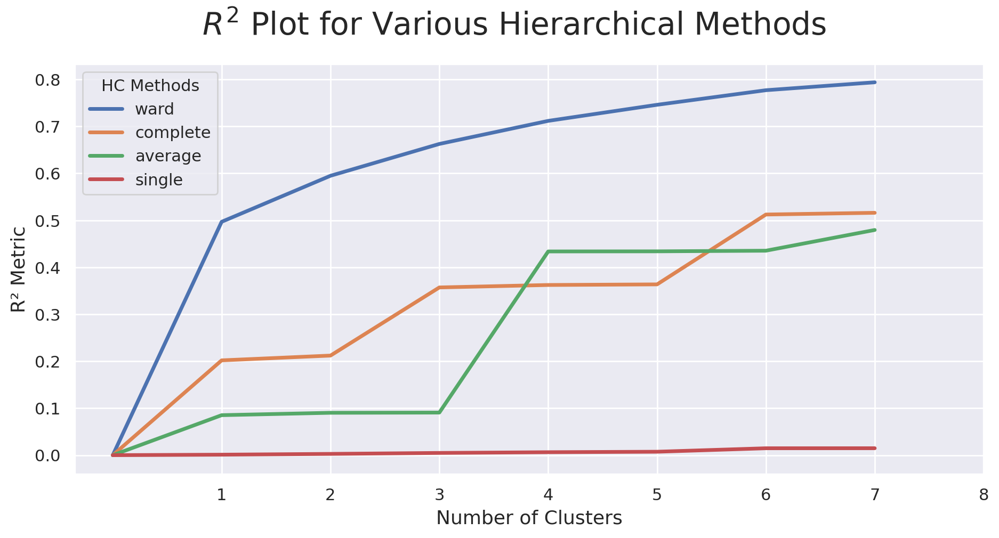

In [282]:
# Plotting the R² values for Hierarchical Clustering Methods
sns.set()

# Create a figure for the plot
fig = plt.figure(figsize=(11, 5))

# Plot the R² values for each clustering method
for i, link in enumerate(hc_methods):
    sns.lineplot(data=r2_hc[i], linewidth=2.5, markers=["o"] * max_nclus, label=link)

# Finalize the plot
plt.legend(title="HC Methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of Clusters", fontsize=13)
plt.ylabel("R² Metric", fontsize=13)
fig.suptitle("$R^2$ Plot for Various Hierarchical Methods", fontsize=21)

plt.show()

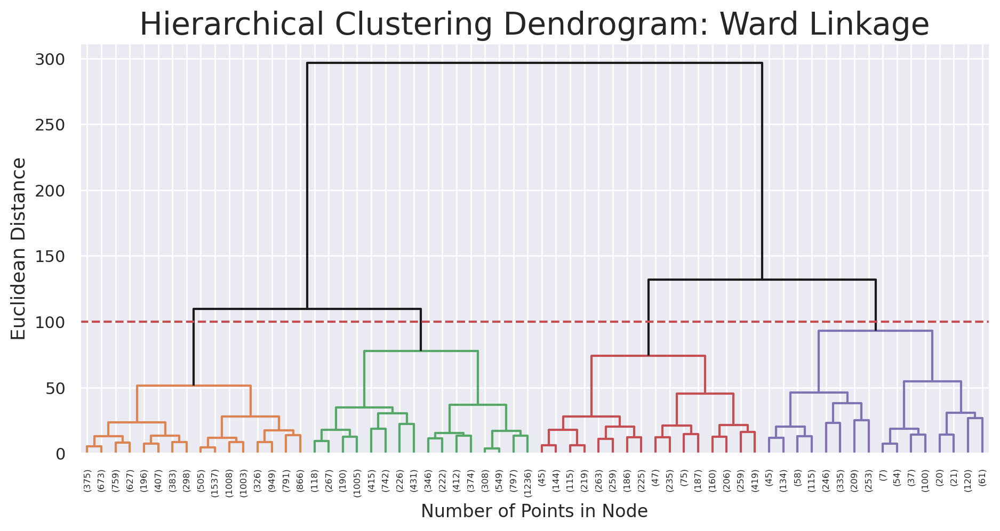

In [283]:
# Plotting the Dendrogram for Hierarchical Clustering
# Using the 'ward' method for dendrogram plotting (you can adjust this method)
linkage_matrix = linkage(spending_diversity_df.values, method="ward", metric="euclidean")

sns.set()
fig = plt.figure(figsize=(11, 5))
# Set a threshold for cutting the dendrogram
y_threshold = 100
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering Dendrogram: Ward Linkage', fontsize=21)
plt.xlabel('Number of Points in Node')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [284]:
avg_silhouette = []
for nclus in range(3, 9):
    # Skip nclus == 1
    if nclus == 1:
        continue

    cluster = AgglomerativeClustering(n_clusters=nclus, metric="euclidean", linkage="ward") # Example params
    hc_labels = cluster.fit_predict(spending_diversity_df)

    # Calculate centroids based on these hierarchical clusters
    centroids = []
    for i in range(nclus):
        cluster_points = spending_diversity_df[hc_labels == i]  # Get points belonging to cluster i
        centroid = cluster_points.mean(axis=0)  # Calculate the mean of these points (centroid)
        centroids.append(centroid)

    centroids = np.array(centroids)

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init=centroids, n_init=1, random_state=20)
    cluster_labels = kmclust.fit_predict(spending_diversity_df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(spending_diversity_df, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

For n_clusters = 3, the average silhouette_score is : 0.4699058087426983
For n_clusters = 4, the average silhouette_score is : 0.3632506068345128
For n_clusters = 5, the average silhouette_score is : 0.38447838898330966
For n_clusters = 6, the average silhouette_score is : 0.38783556814610237
For n_clusters = 7, the average silhouette_score is : 0.3709888622923027
For n_clusters = 8, the average silhouette_score is : 0.3667686412754786


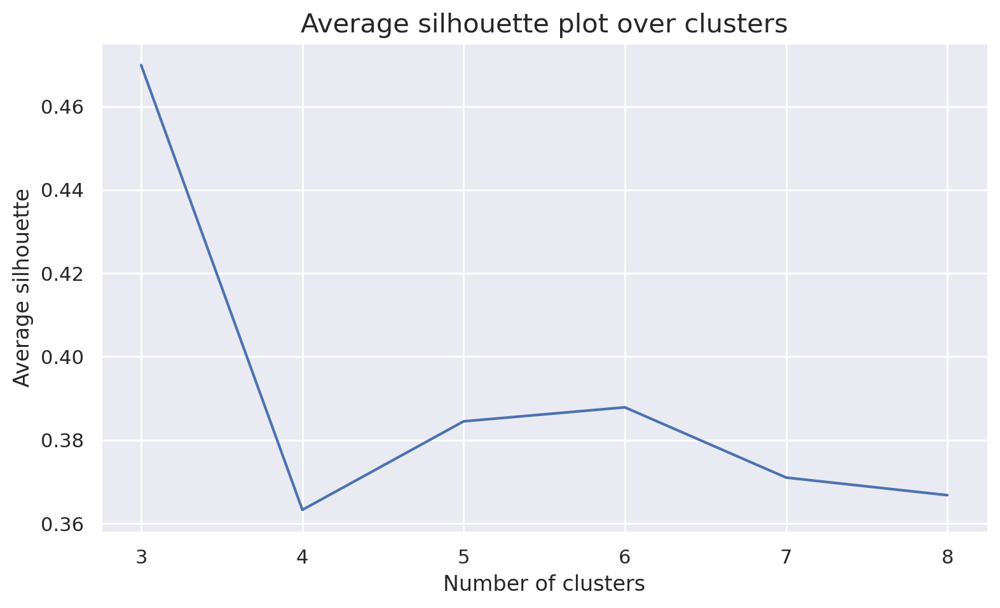

In [285]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))


#  Why range_clusters[1:] ? 
# Remember we skipped k=1 in the cell above

plt.plot(range(3, 9), ## Plot X-axis; 
         avg_silhouette)     ## Plot Y-axis

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [295]:
n_clusters = 3

# Get the labels from hierarchical chosen clustering solution
cluster = AgglomerativeClustering(n_clusters=n_clusters, metric="euclidean", linkage="ward")
hc_labels = cluster.fit_predict(spending_diversity_df)

# Calculate centroids based on these hierarchical clusters
centroids = []
for i in range(n_clusters):
    cluster_points = spending_diversity_df[hc_labels == i]  # Get points belonging to cluster i
    centroid = cluster_points.mean(axis=0)  # Calculate the mean of these points (centroid)
    centroids.append(centroid)

centroids = np.array(centroids)

In [296]:
# Hierarchical Clustreing centroids as seeds for Kmeans init
kmeans = KMeans(n_clusters=n_clusters, init=centroids, n_init=1, random_state=20)  # n_init=1 since we are providing initial centroids
kmeans.fit(spending_diversity_df)

# Calculate the silhouette score to evaluate clustering
silhouette_avg = silhouette_score(spending_diversity_df, kmeans.labels_)
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.4699058087426983


In [297]:
df_concat = pd.concat([
    spending_diversity_df, 
    pd.Series(hc_labels, name='labels', index=spending_diversity_df.index)
    ], 
    axis=1)
df_concat.groupby('labels').median()

,total_amt,n_cuisines,n_vendor,n_product
labels,,,,
0,-0.459573,-0.445118,-0.634527,-0.438751
1,1.170875,2.294516,2.017649,2.119708
2,0.714538,0.924699,0.881002,0.584633


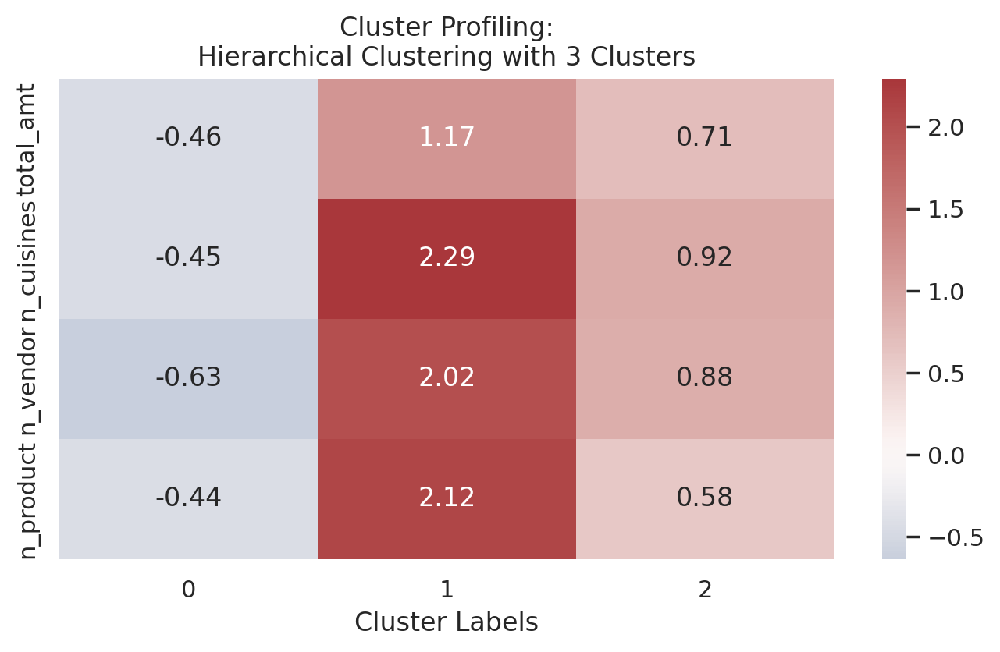

In [298]:
fig, ax = plt.subplots(figsize=(8,4))

hc_profile = df_concat.groupby('labels').median().T

sns.heatmap(hc_profile,
            center=0, annot=True, cmap="vlag", fmt=".2f",
            ax=ax 
            )

ax.set_xlabel("Cluster Labels")
ax.set_title(f"Cluster Profiling:\nHierarchical Clustering with {n_clusters} Clusters")
plt.show()

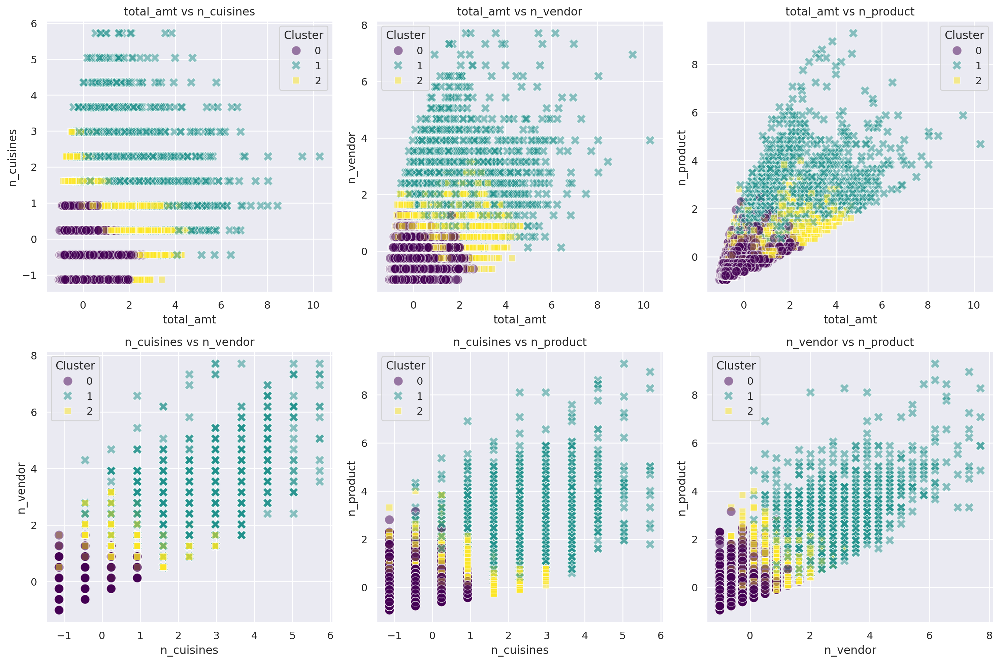

In [299]:
import itertools

combinations = list(itertools.combinations(df_concat.columns[:-1], 2))
n_combinations = len(combinations)

# Step 3: Set up subplots
n_cols = 3  # Number of columns in the grid
n_rows = (n_combinations + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))

# Step 4: Plot each combination
for ax, (feature_x, feature_y) in zip(axes.flatten(), combinations):
    sns.scatterplot(
        data=df_concat,
        x=feature_x,
        y=feature_y,
        hue='labels',  # Cluster labels
        palette='viridis',
        style='labels',  # Optional: use style for labels too
        s=100,  # Point size
        alpha=0.5,  # Transparency
        ax=ax
    )
    ax.set_title(f"{feature_x} vs {feature_y}")
    ax.set_xlabel(feature_x)
    ax.set_ylabel(feature_y)
    ax.legend(title="Cluster", loc='best')
    ax.grid(True)

# Remove any empty subplots
for i in range(n_combinations, n_rows * n_cols):
    fig.delaxes(axes.flatten()[i])

# Step 5: Adjust layout
plt.tight_layout()
plt.show()

In [300]:
df_means = df_concat.mean()
df_means.name="Data"

pd.concat([hc_profile, df_means], axis=1)

,0,1,2,Data
total_amt,-0.459573,1.170875,0.714538,-0.018682
n_cuisines,-0.445118,2.294516,0.924699,-0.008164
n_vendor,-0.634527,2.017649,0.881002,-0.011004
n_product,-0.438751,2.119708,0.584633,-0.022611
labels,NaN,NaN,NaN,0.340647


In [301]:
# Identify promo columns
promo_columns = [col for col in regulars.columns if col.startswith('cust_city_')]

df_concat = pd.concat([df_concat, regulars[promo_columns]], axis=1)

In [302]:
df_filtered = df_concat[df_concat[promo_columns].sum(axis=1) > 0]

# Group by 'labels' and compute mean for each one-hot encoded column
cluster_profile = df_filtered.groupby('labels')[promo_columns].mean().reset_index()

# Display cluster profiling
print("Cluster Profiling Based on Last Promo:")
print(cluster_profile)

Cluster Profiling Based on Last Promo:
   labels  cust_city_2.0  cust_city_4.0  cust_city_8.0
0       0       0.341966       0.338913       0.319121
1       1       0.542149       0.277686       0.180165
2       2       0.317674       0.278581       0.403745


In [303]:
# Create an empty DataFrame to store results
result_list = []

# Loop through each promo column to filter and compute medians
for promo in promo_columns:
    # Filter customers with non-zero values for the specific promo column
    filtered_df = df_concat[df_concat[promo] > 0]
    
    # Group by 'labels' and compute the median 'total_amt' for this promo
    median_total_amt = (
        filtered_df
        .groupby('labels')['total_amt']
        .median()
        .reset_index()
    )
    
    # Add the promo column name for clarity
    median_total_amt['promo_type'] = promo
    result_list.append(median_total_amt)

# Concatenate results for all promos
final_result = pd.concat(result_list, ignore_index=True)

# Display results
print("Median Total Amount by Labels and Promo Types:")
display(final_result)

Median Total Amount by Labels and Promo Types:


,labels,total_amt,promo_type
0,0,-0.730160,cust_city_2.0
1,1,0.590374,cust_city_2.0
2,2,-0.221387,cust_city_2.0
3,0,-0.382280,cust_city_4.0
4,1,1.933540,cust_city_4.0
5,2,0.798632,cust_city_4.0
6,0,-0.152380,cust_city_8.0
7,1,3.380587,cust_city_8.0
8,2,1.468917,cust_city_8.0


## 5.2. Engagement Clustering

In [63]:
engagement_features = [
    *[col for col in regulars.columns if col.startswith('DOW_')]
    ,*[col for col in regulars.columns if col.startswith('HR_')]
    # ,'american', 'asian', 'beverages', 'cafe', 'chicken_dishes', 'chinese'
    # ,'desserts', 'healthy', 'indian', 'italian', 'japanese'
    # ,'noodle_dishes', 'other', 'street_food_snacks', 'thai'
    # ,'log_american', 'log_asian', 'log_beverages', 'log_cafe', 'log_chicken_dishes', 'log_chinese'
    # ,'log_desserts', 'log_healthy', 'log_indian', 'log_italian', 'log_japanese'
    # ,'log_noodle_dishes', 'log_other', 'log_street_food_snacks', 'log_thai'
    # ,'days_cust'
    # ,'n_order'
    # ,'avg_amt_per_order'
    # ,'avg_amt_per_product'
    # ,'avg_amt_per_vendor'
]

In [64]:
engagement_df = regulars[engagement_features]

In [65]:
# Some helper functions
def tidy_ax(ax, major_ticks, minor_ticks, minor_lim=None):

    ax.set_xticks(major_ticks-.5)
    ax.set_xticks(minor_ticks-.5, minor=True)

    ax.set_xticklabels([])
    ax.set_yticklabels([])

    ax.grid(which='both', alpha=0.5, color='white', linewidth=1)

    ax.tick_params(axis='both', which='both', direction="in", width=0, length=0)

    if minor_lim == None:
        minor_lim = major_ticks.max()

    ax.set_yticks(major_ticks[major_ticks<minor_lim]-.5, )
    ax.set_yticks(minor_ticks[minor_ticks<minor_lim]-.5, minor=True)
    
    ax.set_aspect(1)

    return ax

In [66]:
M = 22
N = 22
neighborhood_function = 'gaussian' 
topology = 'hexagonal' 
n_feats = len(engagement_features)
learning_rate = .5

som_data = engagement_df.values

sm = MiniSom(M, N,              # 10x10 map size
             n_feats,           # Number of the elements of the vectors in input.
             learning_rate=learning_rate, 
             topology=topology, 
             neighborhood_function=neighborhood_function, 
             activation_distance='euclidean',
             random_seed=20
             )

# Initializes the weights of the SOM picking random samples from data.
sm.random_weights_init(som_data) 

print("Before training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))

# Trains the SOM using all the vectors in data sequentially
# minisom does not distinguish between unfolding and fine tuning phase;

sm.train_batch(som_data, 2000)
# sm.train_random(data=som_data, num_iteration=100)

print("After training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))

Before training:


/home/shadybea/anaconda3/envs/dm/lib/python3.12/site-packages/minisom.py:631: RuntimeWarning: invalid value encountered in sqrt
  return sqrt(-2 * cross_term + input_data_sq + weights_flat_sq.T)


QE 3.0981
TE 0.986
After training:
QE 3.1095
TE 0.6152


In [67]:
weights = sm.get_weights()
weights.shape

(22, 22, 31)

In [68]:
def plot_hexagons(som,              # Trained SOM model 
                  sf,               # matplotlib figure object
                  colornorm,        # colornorm
                  matrix_vals,      # SOM weights or
                  label="",         # title for figure
                  cmap=cm.Grays,    # colormap to use
                  annot=False       
                  ):

    
    axs = sf.subplots(1,1)
    
    for i in range(matrix_vals.shape[0]):
        for j in range(matrix_vals.shape[1]):

            wx, wy = som.convert_map_to_euclidean((i,j)) 

            hex = RegularPolygon((wx, wy), 
                                numVertices=6, 
                                radius= np.sqrt(1/3),
                                facecolor=cmap(colornorm(matrix_vals[i, j])), 
                                alpha=1, 
                                edgecolor='white',
                                linewidth=.5)
            axs.add_patch(hex)
            if annot==True:
                annot_val = np.round(matrix_vals[i,j],2)
                if int(annot_val) == annot_val:
                    annot_val = int(annot_val)
                axs.text(wx,wy, annot_val, 
                        ha='center', va='center', 
                        fontsize=5)


    ## Remove axes for hex plot
    axs.margins(.05)
    axs.set_aspect('equal')
    axs.axis("off")
    axs.set_title(label)

    

    # ## Add colorbar
    divider = make_axes_locatable(axs)
    ax_cb = divider.append_axes("right", size="5%", pad="0%")

    ## Create a Mappable object
    cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
    cmap_sm.set_array([])

    ## Create custom colorbar 
    cb1 = colorbar.Colorbar(ax_cb,
                            orientation='vertical', 
                            alpha=1,
                            mappable=cmap_sm
                            )
    cb1.ax.get_yaxis().labelpad = 6

    # Add colorbar to plot
    sf.add_axes(ax_cb)

    return sf 

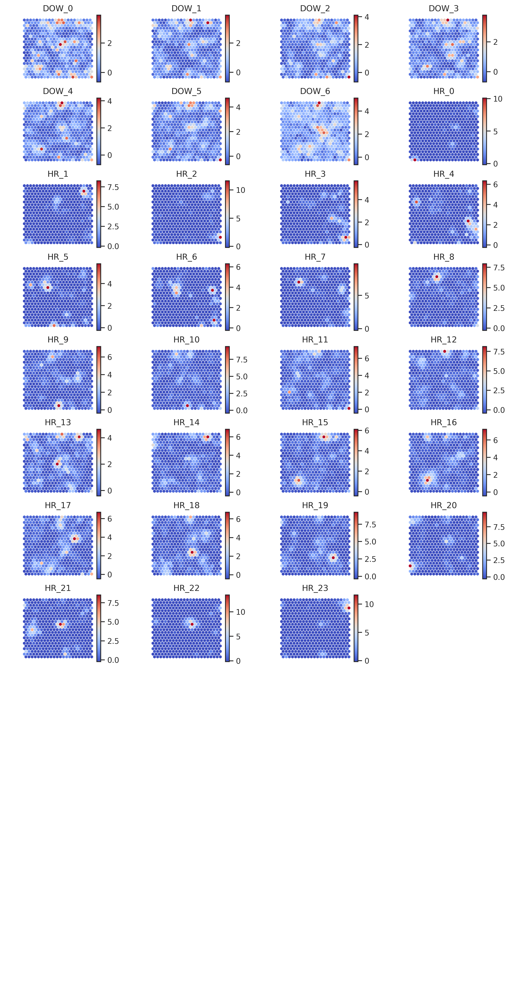

In [69]:
##############################
# Plot Component Planes
##############################

figsize=(10,20)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128, )

subfigs = fig.subfigures(12,4,wspace=.15)

colornorm = mpl_colors.Normalize(vmin=np.min(weights), vmax=np.max(weights))

for cpi, sf in zip(range(len(engagement_features)), subfigs.flatten()):
    
    matrix_vals = weights[:,:,cpi]
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))
    # colornorm = mpl_colors.CenteredNorm(vcenter=0, halfrange=vext)


    sf = plot_hexagons(sm, sf, 
                    colornorm,
                    matrix_vals,
                    label=engagement_features[cpi],
                    cmap=cm.coolwarm,
                    )

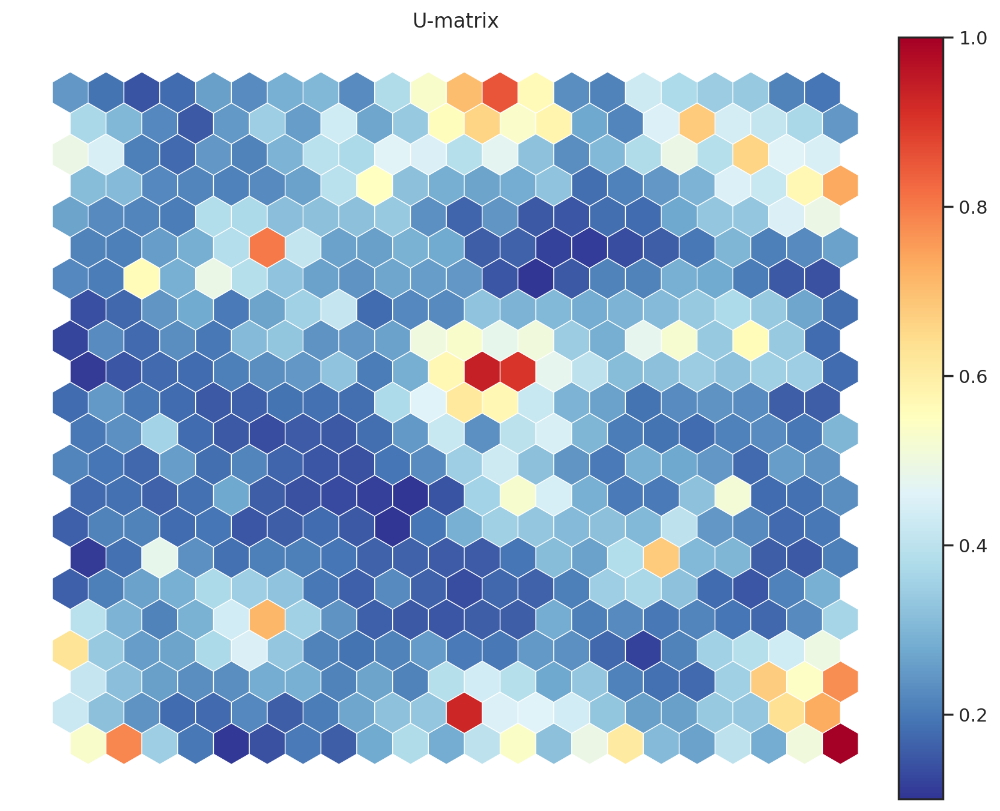

In [70]:
figsize=(10,20)

umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r
                    )

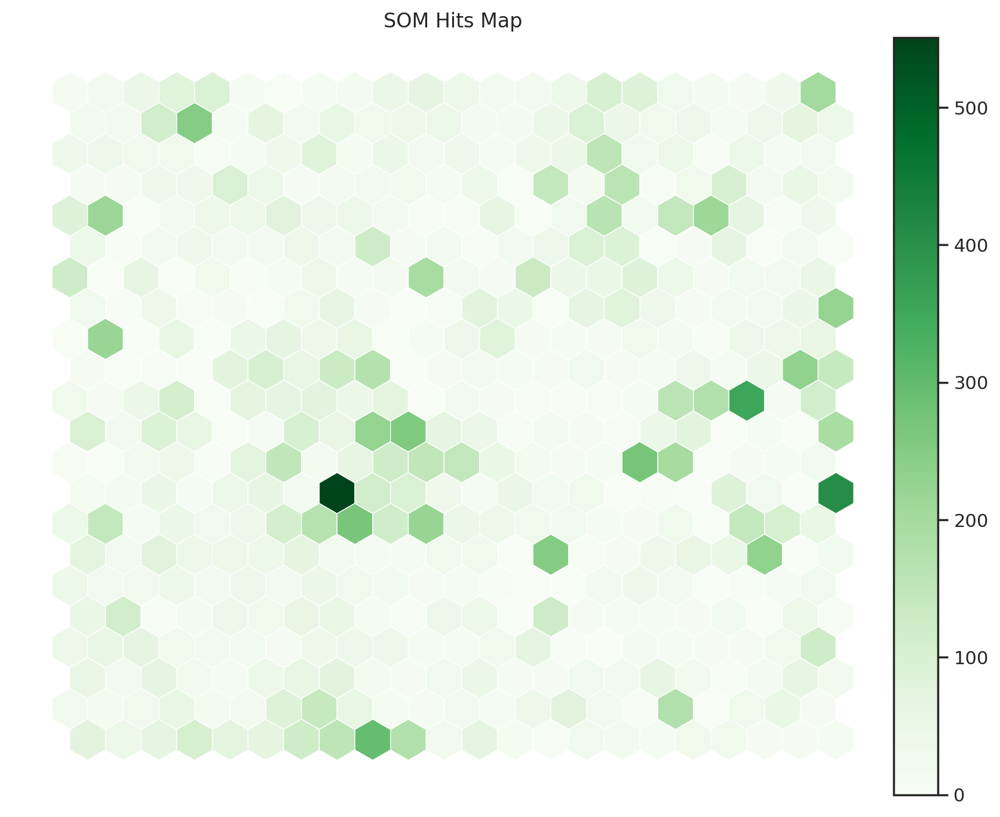

In [71]:
hitsmatrix = sm.activation_response(engagement_df.values)


fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens
                    )


In [72]:
sm.quantization_error(engagement_df.values)

3.1095191585368656

In [73]:
weights_flat = sm.get_weights().reshape((M*N),len(engagement_df.columns))
weights_flat.shape

(484, 31)

In [74]:
avg_silhouette = []
for nclus in range(1, 11):
    # Skip nclus == 1
    if nclus == 1:
        continue

    # cluster = AgglomerativeClustering(n_clusters=nclus, metric="euclidean", linkage="ward") # Example params
    # hc_labels = cluster.fit_predict(engagement_df)

    # # Calculate centroids based on these hierarchical clusters
    # centroids = []
    # for i in range(nclus):
    #     cluster_points = engagement_df[hc_labels == i]  # Get points belonging to cluster i
    #     centroid = cluster_points.mean(axis=0)  # Calculate the mean of these points (centroid)
    #     centroids.append(centroid)

    # centroids = np.array(centroids)

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=10, random_state=20)
    cluster_labels = kmclust.fit_predict(weights_flat)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(weights_flat, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

For n_clusters = 2, the average silhouette_score is : 0.4067735731202392
For n_clusters = 3, the average silhouette_score is : 0.2443794489003643
For n_clusters = 4, the average silhouette_score is : 0.2523819325927498
For n_clusters = 5, the average silhouette_score is : 0.19403947823008144
For n_clusters = 6, the average silhouette_score is : 0.18846446357387303
For n_clusters = 7, the average silhouette_score is : 0.21322246864178296
For n_clusters = 8, the average silhouette_score is : 0.1901016882387653
For n_clusters = 9, the average silhouette_score is : 0.20068628974813457
For n_clusters = 10, the average silhouette_score is : 0.1428863592360401


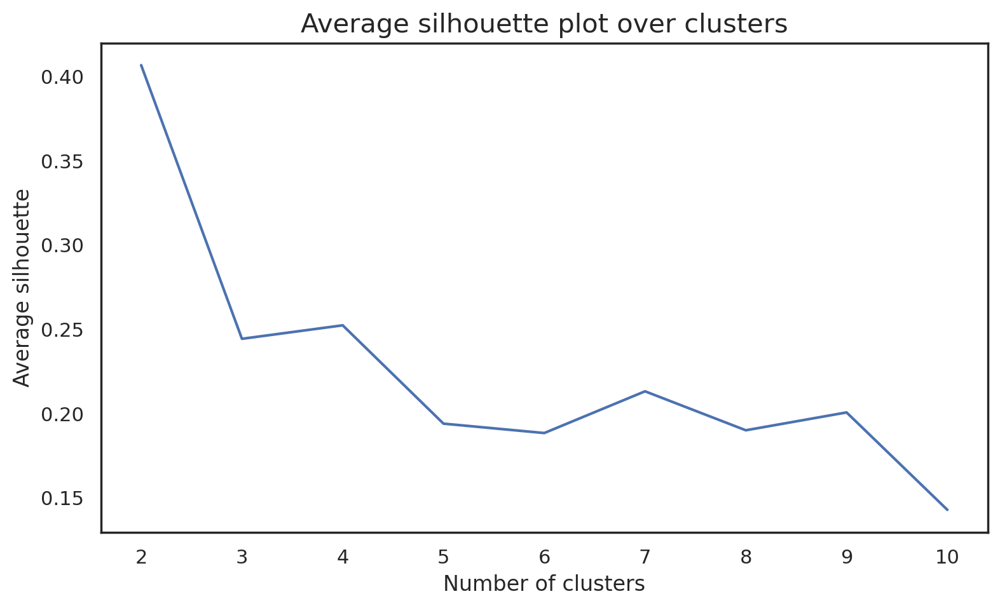

In [75]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))


#  Why range_clusters[1:] ? 
# Remember we skipped k=1 in the cell above

plt.plot(range(2, 11), ## Plot X-axis; 
         avg_silhouette)     ## Plot Y-axis

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [76]:
# n_clusters = 3

# cluster = AgglomerativeClustering(n_clusters=n_clusters, metric="euclidean", linkage="ward") # Example params
# hc_labels = cluster.fit_predict(engagement_df)

# # Calculate centroids based on these hierarchical clusters
# centroids = []
# for i in range(nclus):
#     cluster_points = engagement_df[hc_labels == i]  # Get points belonging to cluster i
#     centroid = cluster_points.mean(axis=0)  # Calculate the mean of these points (centroid)
#     centroids.append(centroid)

# centroids = np.array(centroids)

In [110]:
from sklearn_extra.cluster import KMedoids

In [111]:
# Perform K-Means clustering on top of the MxN units (sm.get_node_vectors() output)
kmeans = KMedoids(n_clusters=2, init='k-medoids++', random_state=20)
nodeclus_labels = kmeans.fit_predict(weights_flat)

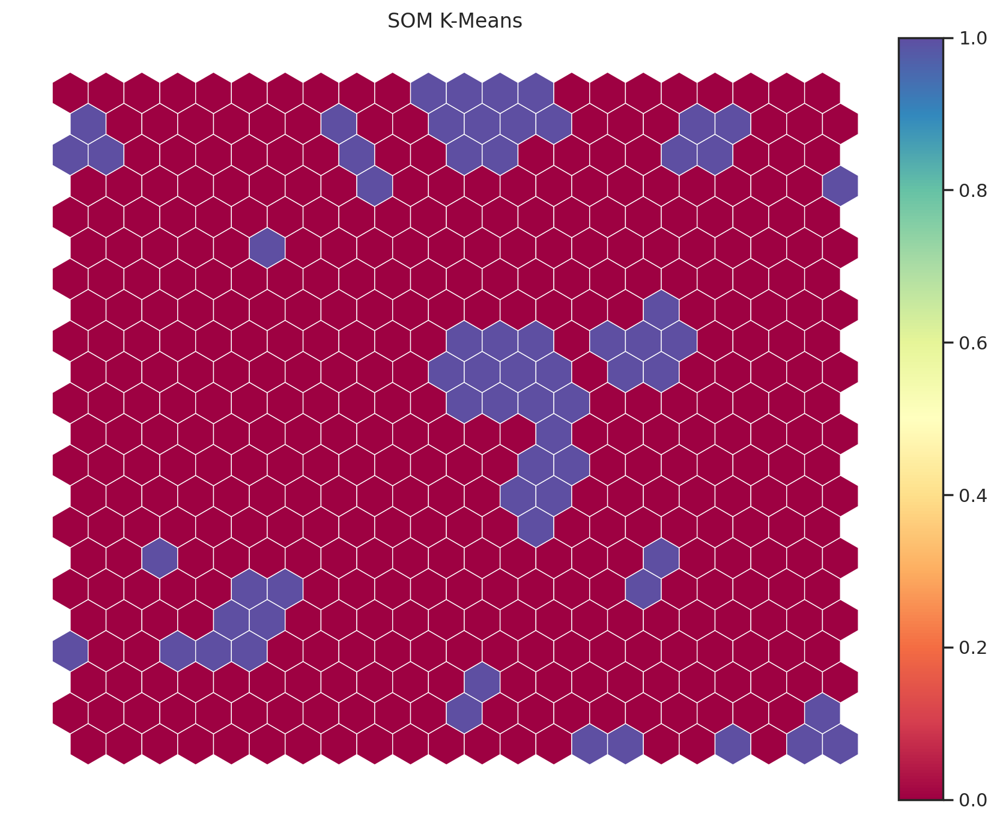

In [112]:
kmeans_matrix = nodeclus_labels.reshape((M,N))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    kmeans_matrix,
                    label="SOM K-Means",
                    cmap=cm.Spectral,
                    )

In [113]:
# Check the nodes and and respective clusters
nodes = weights_flat

df_nodes = pd.DataFrame(nodes, columns=engagement_features)
df_nodes['label'] = nodeclus_labels
df_nodes.head()

,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,label
0,0.441579,0.159563,-0.335078,-0.023363,-0.586318,-0.178260,1.435836,4.314458,1.359389,0.794577,0.321001,0.020663,1.044708,-0.025854,0.235882,0.415802,-0.165450,0.375990,-0.182086,-0.228108,0.119895,-0.358576,-0.305907,-0.407654,-0.471407,-0.428299,-0.296969,-0.047606,-0.141326,-0.183808,0.590513,0
1,0.766280,-0.344329,-0.481411,-0.271389,-0.570720,-0.126077,0.673277,0.257318,0.456176,-0.081906,-0.088552,-0.249086,-0.087112,-0.221744,-0.236435,-0.243453,-0.243338,-0.084071,-0.045026,0.031871,-0.399696,-0.218495,-0.407802,-0.150688,-0.457499,-0.283868,0.074136,2.325255,1.214521,-0.174963,-0.095083,0
2,0.772080,0.048730,1.015224,0.471420,0.349291,-0.525367,0.583337,-0.162439,-0.176852,-0.188196,-0.254909,-0.252264,-0.247950,-0.231848,-0.243495,-0.230172,-0.065776,-0.230801,-0.185118,0.304232,0.476861,-0.192909,-0.116463,-0.446695,-0.382111,0.322520,0.411316,4.655434,3.229700,0.162492,-0.182444,0
3,1.403165,0.428967,0.968924,1.039498,0.577342,1.372268,1.628624,0.135159,-0.185020,0.359829,-0.257589,0.004005,-0.249167,-0.232336,-0.243496,-0.214730,-0.361445,-0.213159,0.086100,-0.013125,0.189826,0.021539,0.210628,-0.270864,-0.221609,0.859167,3.175201,9.670864,-0.044394,0.137281,-0.181256,1
4,1.510932,0.363318,1.022696,0.341899,-0.144382,0.053179,-0.203173,-0.167778,-0.185025,0.152706,-0.220383,-0.206236,-0.249167,-0.232336,-0.243496,-0.218288,-0.324802,-0.008408,-0.052892,0.029449,-0.202019,0.011650,-0.014924,0.024233,-0.141133,1.228295,1.181553,3.727872,-0.165309,-0.136015,0.077737,0


In [114]:
## This gets BMU coordinates, e.g. (4,4) for each data point
bmu_index = np.array([sm.winner(x) for x in engagement_df.values])

print(bmu_index.shape)

bmu_index

(23200, 2)


array([[20, 20],
       [20,  7],
       [14, 16],
       ...,
       [18, 18],
       [ 7,  8],
       [19,  7]])

In [115]:
## This gets the cluster label from kmeans_matrix
som_final_labels = [kmeans_matrix[i[0]][i[1]] for i in bmu_index]

In [116]:
df_final = pd.concat([
    engagement_df,
    pd.Series(som_final_labels, name='label', index=engagement_df.index)
], axis=1)

df_final.head()

,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,label
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
392537344460,-0.654153,-0.650697,0.292475,-0.695157,-0.739816,-0.709954,1.003126,-0.175163,-0.185042,-0.201250,-0.257621,-0.255983,-0.249167,-0.232336,-0.243496,-0.268986,-0.368712,-0.430681,-0.467335,-0.436,-0.424103,-0.409606,-0.43416,-0.468338,0.546941,-0.434366,0.879759,-0.295737,-0.230157,-0.183809,3.329023,0
568938099255,-0.654153,-0.650697,0.292475,-0.695157,-0.739816,-0.709954,0.147443,-0.175163,-0.185042,-0.201250,1.586116,1.911946,-0.249167,-0.232336,-0.243496,-0.268986,-0.368712,-0.430681,-0.467335,-0.436,-0.424103,-0.409606,-0.43416,-0.468338,-0.471480,-0.434366,-0.365838,-0.295737,-0.230157,-0.183809,-0.187572,0
950459557146,-0.654153,-0.650697,0.292475,-0.695157,-0.739816,-0.709954,0.147443,-0.175163,-0.185042,-0.201250,-0.257621,-0.255983,-0.249167,-0.232336,-0.243496,-0.268986,-0.368712,-0.430681,0.586679,-0.436,-0.424103,-0.409606,-0.43416,-0.468338,-0.471480,-0.434366,0.879759,-0.295737,-0.230157,-0.183809,-0.187572,0
339296060607,-0.654153,-0.650697,-0.678997,0.257240,-0.739816,-0.709954,0.147443,-0.175163,-0.185042,-0.201250,-0.257621,-0.255983,-0.249167,-0.232336,-0.243496,-0.268986,-0.368712,-0.430681,-0.467335,-0.436,-0.424103,-0.409606,-0.43416,0.641269,-0.471480,0.648211,-0.365838,-0.295737,-0.230157,-0.183809,-0.187572,0
580679708215,-0.654153,-0.650697,-0.678997,0.257240,-0.739816,-0.709954,0.147443,-0.175163,-0.185042,2.551163,-0.257621,1.911946,-0.249167,-0.232336,-0.243496,-0.268986,-0.368712,-0.430681,-0.467335,-0.436,-0.424103,-0.409606,-0.43416,-0.468338,-0.471480,-0.434366,-0.365838,-0.295737,-0.230157,-0.183809,-0.187572,0


In [117]:
# Characterizing the final clusters
df_final.groupby('label').mean()

,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
label,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-0.127792,-0.126601,-0.128722,-0.129696,-0.125836,-0.115992,-0.117537,-0.011329,-0.005975,-0.003297,0.006896,0.005559,0.004279,-0.003185,-0.020787,-0.042925,-0.054871,-0.079363,-0.101101,-0.097267,-0.086337,-0.083316,-0.086548,-0.083355,-0.100994,-0.101842,-0.087707,-0.074233,-0.053818,-0.064582,-0.028336
1,1.437425,1.411887,1.443870,1.459290,1.432839,1.317880,1.337298,-0.005794,-0.033215,-0.070959,-0.162707,-0.166188,-0.136568,-0.052300,0.132691,0.387268,0.597701,0.902052,1.218464,1.175591,1.005639,0.948274,1.050701,0.995818,1.171853,1.186297,1.041171,0.884253,0.587721,0.708038,0.268129


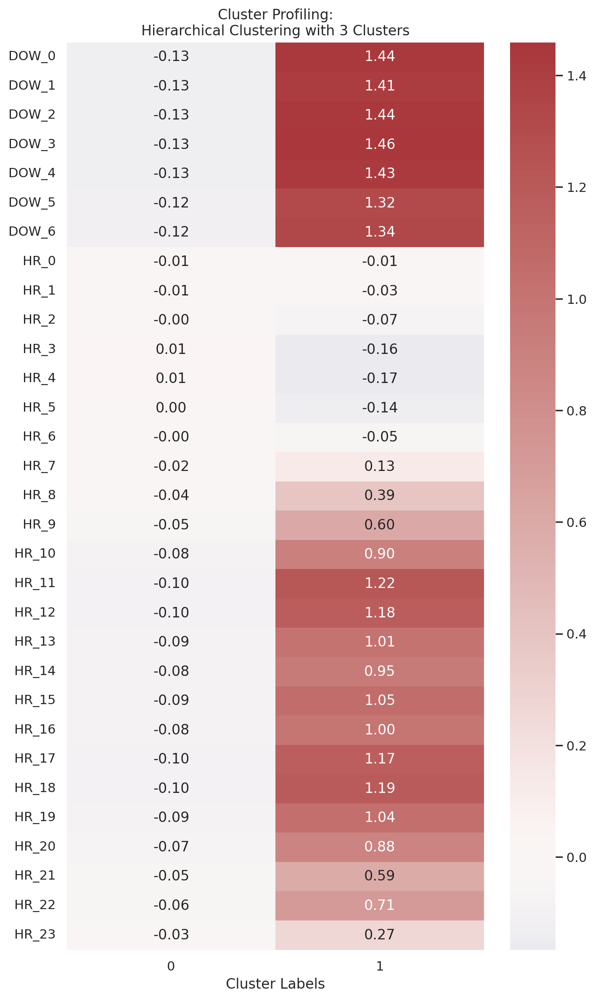

In [118]:
fig, ax = plt.subplots(figsize=(8,14))

hc_profile = df_final.groupby('label').mean().T

sns.heatmap(hc_profile,
            center=0, annot=True, cmap="vlag", fmt=".2f",
            ax=ax 
            )

ax.set_xlabel("Cluster Labels")
ax.set_title("Cluster Profiling:\nHierarchical Clustering with 3 Clusters")
plt.show()

In [119]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_final.drop(columns='label'))  # get total sum of squares
ssw_labels = df_final.groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

/tmp/ipykernel_24352/3006040016.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ssw_labels = df_final.groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels


0.07681656275582453

In [120]:
sm.quantization_error(som_data)

3.1095191585368656

In [121]:
sm.topographic_error(som_data)

0.6151724137931034